# **Initial Set-up:**

In [4]:
# Step 1: Import libraries
import pandas as pd
import numpy as np
import os
import glob

# Step 2: Set the dataset path
dataset_path = "/kaggle/input/soil-dataset"

# Step 3: Grab all TXT files with correct folder names
hourly_files = glob.glob(os.path.join(dataset_path, "Hourly", "*.txt"))
daily_files = glob.glob(os.path.join(dataset_path, "Daily", "*.txt"))

print(f"Hourly files found: {len(hourly_files)}")
print(f"Daily files found: {len(daily_files)}")

# Step 4: Function to read and combine TXT files
def load_and_combine(file_list, sep="\t"):
    df_list = []
    for file in file_list:
        try:
            df = pd.read_csv(file, sep=sep, engine='python')
            df_list.append(df)
        except Exception as e:
            print(f"Error reading {file}: {e}")
    if df_list:  # only concatenate if at least one file loaded
        combined_df = pd.concat(df_list, ignore_index=True)
        return combined_df
    else:
        print("No files were loaded.")
        return pd.DataFrame()

# Step 5: Load datasets
hourly_df = load_and_combine(hourly_files)
daily_df = load_and_combine(daily_files)

print("Hourly dataset shape:", hourly_df.shape)
print("Daily dataset shape:", daily_df.shape)

# Step 6: Quick inspection
print("Hourly dataset sample:")
display(hourly_df.head())

print("Daily dataset sample:")
display(daily_df.head())

# Step 7: Handle missing values
hourly_df.fillna(method='ffill', inplace=True)
daily_df.fillna(method='ffill', inplace=True)

print("Hourly missing values:\n", hourly_df.isnull().sum())
print("Daily missing values:\n", daily_df.isnull().sum())

# Step 8: Convert timestamp columns to datetime (if any)
for col in hourly_df.columns:
    if 'time' in col.lower() or 'date' in col.lower():
        hourly_df[col] = pd.to_datetime(hourly_df[col], errors='coerce')

for col in daily_df.columns:
    if 'time' in col.lower() or 'date' in col.lower():
        daily_df[col] = pd.to_datetime(daily_df[col], errors='coerce')

print("Timestamps converted to datetime successfully.")


Hourly files found: 42
Daily files found: 42
Hourly dataset shape: (3373658, 13)
Daily dataset shape: (140532, 12)
Hourly dataset sample:


,Location,Date,Time,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm,T_30cm,T_60cm,T_90cm,T_120cm,T_150cm
0,CAF141,04/20/2007,0:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CAF141,04/20/2007,1:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CAF141,04/20/2007,2:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CAF141,04/20/2007,3:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CAF141,04/20/2007,4:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Daily dataset sample:


,Location,Date,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm,T_30cm,T_60cm,T_90cm,T_120cm,T_150cm
0,CAF141,04/20/2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CAF141,04/21/2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CAF141,04/22/2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CAF141,04/23/2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CAF141,04/24/2007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/tmp/ipykernel_55/1584420422.py:48: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  hourly_df.fillna(method='ffill', inplace=True)
/tmp/ipykernel_55/1584420422.py:49: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  daily_df.fillna(method='ffill', inplace=True)


Hourly missing values:
 Location        0
Date            0
Time            0
VW_30cm     18229
VW_60cm     18229
VW_90cm     18229
VW_120cm    18229
VW_150cm    18229
T_30cm      18229
T_60cm      18229
T_90cm      18229
T_120cm     18229
T_150cm     18229
dtype: int64
Daily missing values:
 Location      0
Date          0
VW_30cm     759
VW_60cm     759
VW_90cm     759
VW_120cm    759
VW_150cm    759
T_30cm      759
T_60cm      759
T_90cm      759
T_120cm     759
T_150cm     759
dtype: int64


/tmp/ipykernel_55/1584420422.py:57: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  hourly_df[col] = pd.to_datetime(hourly_df[col], errors='coerce')


Timestamps converted to datetime successfully.


# **Data Description:**

In [5]:
print("Hourly info:")
display(hourly_df.info())

print("\nDaily info:")
display(daily_df.info())

print("\nHourly describe:")
display(hourly_df.describe())

print("\nDaily describe:")
display(daily_df.describe())


Hourly info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3373658 entries, 0 to 3373657
Data columns (total 13 columns):
 #   Column    Dtype         
---  ------    -----         
 0   Location  object        
 1   Date      datetime64[ns]
 2   Time      datetime64[ns]
 3   VW_30cm   float64       
 4   VW_60cm   float64       
 5   VW_90cm   float64       
 6   VW_120cm  float64       
 7   VW_150cm  float64       
 8   T_30cm    float64       
 9   T_60cm    float64       
 10  T_90cm    float64       
 11  T_120cm   float64       
 12  T_150cm   float64       
dtypes: datetime64[ns](2), float64(10), object(1)
memory usage: 334.6+ MB


None


Daily info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140532 entries, 0 to 140531
Data columns (total 12 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Location  140532 non-null  object        
 1   Date      140532 non-null  datetime64[ns]
 2   VW_30cm   139773 non-null  float64       
 3   VW_60cm   139773 non-null  float64       
 4   VW_90cm   139773 non-null  float64       
 5   VW_120cm  139773 non-null  float64       
 6   VW_150cm  139773 non-null  float64       
 7   T_30cm    139773 non-null  float64       
 8   T_60cm    139773 non-null  float64       
 9   T_90cm    139773 non-null  float64       
 10  T_120cm   139773 non-null  float64       
 11  T_150cm   139773 non-null  float64       
dtypes: datetime64[ns](1), float64(10), object(1)
memory usage: 12.9+ MB


None


Hourly describe:


,Date,Time,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm,T_30cm,T_60cm,T_90cm,T_120cm,T_150cm
count,3373658,3373658,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06,3.355429e+06
mean,2011-11-17 22:35:21.398198272,2026-01-30 11:30:10.921677824,2.544894e-01,2.904154e-01,3.141402e-01,3.366275e-01,3.479395e-01,1.174319e+01,1.119884e+01,1.081745e+01,1.061384e+01,1.044032e+01
min,2007-04-20 00:00:00,2026-01-30 00:00:00,7.700000e-02,4.000000e-03,6.100000e-02,9.300000e-02,7.400000e-02,-9.100000e+00,-7.000000e+00,-7.100000e+00,-2.800000e+00,6.000000e-01
25%,2009-08-03 00:00:00,2026-01-30 06:00:00,2.040000e-01,2.170000e-01,2.360000e-01,2.600000e-01,2.770000e-01,5.500000e+00,6.100000e+00,6.400000e+00,7.000000e+00,7.200000e+00
50%,2011-11-18 00:00:00,2026-01-30 12:00:00,2.360000e-01,2.820000e-01,3.110000e-01,3.400000e-01,3.470000e-01,1.310000e+01,1.200000e+01,1.130000e+01,1.100000e+01,1.080000e+01
75%,2014-03-04 00:00:00,2026-01-30 18:00:00,3.040000e-01,3.520000e-01,3.970000e-01,4.060000e-01,4.150000e-01,1.740000e+01,1.570000e+01,1.470000e+01,1.380000e+01,1.320000e+01
max,2016-06-16 00:00:00,2026-01-30 23:00:00,1.010000e+00,6.520000e-01,6.090000e-01,6.310000e-01,6.140000e-01,2.900000e+01,2.340000e+01,2.110000e+01,2.480000e+01,2.530000e+01
std,NaN,NaN,7.435638e-02,9.450503e-02,9.494401e-02,9.316359e-02,9.463440e-02,6.515455e+00,5.346915e+00,4.588296e+00,3.928504e+00,3.523759e+00



Daily describe:


,Date,VW_30cm,VW_60cm,VW_90cm,VW_120cm,VW_150cm,T_30cm,T_60cm,T_90cm,T_120cm,T_150cm
count,140532,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000,139773.000000
mean,2011-11-17 11:59:59.999999744,0.254708,0.291062,0.314880,0.337322,0.347570,11.838297,11.171183,10.811963,10.601271,10.427013
min,2007-04-20 00:00:00,0.078000,0.091000,0.063000,0.094000,0.080000,-9.100000,0.660000,1.840000,1.100000,0.670000
25%,2009-08-03 00:00:00,0.204000,0.217000,0.236000,0.261000,0.279000,5.560000,6.150000,6.425000,7.000000,7.200000
50%,2011-11-17 12:00:00,0.236000,0.279000,0.312000,0.340000,0.347000,13.340000,11.980000,11.310000,11.000000,10.800000
75%,2014-03-03 00:00:00,0.305000,0.353000,0.400000,0.406000,0.413000,17.530000,15.570000,14.700000,13.800000,13.130000
max,2016-06-16 00:00:00,0.688000,0.650000,0.605000,0.631000,0.614000,28.190000,23.320000,21.050000,24.160000,25.050000
std,NaN,0.074222,0.093224,0.095266,0.093213,0.094329,6.586390,5.333941,4.581762,3.927992,3.520395


# **DATA CLEANING:**

In [6]:
# ======================================
# Soil Moisture Dataset Cleaning Pipeline
# ======================================

import pandas as pd

def clean_soil_data(df):
    # 1. Clean column names
    df.columns = (
        df.columns
        .str.strip()
        .str.lower()
        .str.replace(" ", "_")
        .str.replace(r"[^\w]", "", regex=True)
    )

    # 2. Remove empty rows
    df.dropna(how="all", inplace=True)

    # 3. Remove duplicate rows
    df.drop_duplicates(inplace=True)

    # 4. Convert time/date columns to datetime
    for col in df.columns:
        if "time" in col or "date" in col:
            df[col] = pd.to_datetime(df[col], errors="coerce")

    # 5. Convert numeric columns properly
    for col in df.columns:
        if df[col].dtype == "object":
            df[col] = pd.to_numeric(df[col], errors="ignore")

    # 6. Handle missing values (sensor-safe)
    df.ffill(inplace=True)
    df.bfill(inplace=True)

    # 7. Sort by time if available
    time_cols = [c for c in df.columns if "time" in c or "date" in c]
    if time_cols:
        df.sort_values(by=time_cols[0], inplace=True)

    df.reset_index(drop=True, inplace=True)
    return df


# Apply cleaning
hourly_df = clean_soil_data(hourly_df)
daily_df  = clean_soil_data(daily_df)

# Final check
print("Hourly data shape:", hourly_df.shape)
print("Daily data shape:", daily_df.shape)

display(hourly_df.head())
display(daily_df.head())


/tmp/ipykernel_55/1010810344.py:31: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df[col] = pd.to_numeric(df[col], errors="ignore")


Hourly data shape: (3372768, 13)
Daily data shape: (140532, 12)


/tmp/ipykernel_55/1010810344.py:31: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df[col] = pd.to_numeric(df[col], errors="ignore")


,location,date,time,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm
0,CAF141,2007-04-20,2026-01-30 00:00:00,0.394,0.420,0.232,0.151,0.185,16.0,9.9,8.5,8.0,7.8
1,CAF125,2007-04-20,2026-01-30 23:00:00,0.221,0.361,0.401,0.385,0.446,17.4,10.9,9.3,9.2,8.4
2,CAF125,2007-04-20,2026-01-30 22:00:00,0.221,0.361,0.401,0.385,0.446,17.4,10.9,9.3,9.2,8.4
3,CAF125,2007-04-20,2026-01-30 21:00:00,0.221,0.361,0.401,0.385,0.446,17.4,10.9,9.3,9.2,8.4
4,CAF125,2007-04-20,2026-01-30 20:00:00,0.221,0.361,0.401,0.385,0.446,17.4,10.9,9.3,9.2,8.4


,location,date,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm
0,CAF141,2007-04-20,0.392,0.423,0.234,0.155,0.196,13.820,10.25,8.50,7.91,7.650
1,CAF095,2007-04-20,0.338,0.321,0.429,0.422,0.285,11.400,10.49,10.10,9.40,9.014
2,CAF310,2007-04-20,0.372,0.394,0.279,0.401,0.419,3.317,6.20,14.90,5.20,3.689
3,CAF201,2007-04-20,0.238,0.323,0.399,0.332,0.414,14.860,14.15,13.59,13.00,12.200
4,CAF003,2007-04-20,0.235,0.289,0.300,0.357,0.325,14.750,12.89,13.30,11.80,11.100


# **Data Pre-Processing:**

In [7]:
# ======================================
# Soil Moisture Dataset Pre-Processing
# ======================================

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

def preprocess_soil_data(df):
    df = df.copy()

    # 1. Identify datetime column
    time_cols = [c for c in df.columns if "time" in c or "date" in c]
    time_col = time_cols[0] if time_cols else None

    # 2. Create time-based features
    if time_col:
        df["year"]  = df[time_col].dt.year
        df["month"] = df[time_col].dt.month
        df["day"]   = df[time_col].dt.day
        df["hour"]  = df[time_col].dt.hour   # SAFE for both hourly & daily

    # 3. Select numeric columns only
    numeric_cols = df.select_dtypes(include=["int64", "float64"]).columns

    # 4. Handle outliers using IQR clipping
    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df[col] = np.clip(df[col], lower, upper)

    # 5. Feature scaling
    scaler = StandardScaler()
    df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

    return df


# Apply preprocessing
hourly_processed = preprocess_soil_data(hourly_df)
daily_processed  = preprocess_soil_data(daily_df)

# Check results
print("Hourly processed shape:", hourly_processed.shape)
print("Daily processed shape:", daily_processed.shape)

display(hourly_processed.head())
display(daily_processed.head())


Hourly processed shape: (3372768, 17)
Daily processed shape: (140532, 16)


,location,date,time,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,year,month,day,hour
0,CAF141,2007-04-20,2026-01-30 00:00:00,1.926774,1.366398,-0.860809,-1.966516,-1.704166,0.650917,-0.242034,-0.503143,-0.662508,-0.746527,2007,4,20,0
1,CAF125,2007-04-20,2026-01-30 23:00:00,-0.463750,0.741456,0.920704,0.526526,1.041552,0.866106,-0.054548,-0.328445,-0.356589,-0.575847,2007,4,20,0
2,CAF125,2007-04-20,2026-01-30 22:00:00,-0.463750,0.741456,0.920704,0.526526,1.041552,0.866106,-0.054548,-0.328445,-0.356589,-0.575847,2007,4,20,0
3,CAF125,2007-04-20,2026-01-30 21:00:00,-0.463750,0.741456,0.920704,0.526526,1.041552,0.866106,-0.054548,-0.328445,-0.356589,-0.575847,2007,4,20,0
4,CAF125,2007-04-20,2026-01-30 20:00:00,-0.463750,0.741456,0.920704,0.526526,1.041552,0.866106,-0.054548,-0.328445,-0.356589,-0.575847,2007,4,20,0


,location,date,vw_30cm,vw_60cm,vw_90cm,vw_120cm,vw_150cm,t_30cm,t_60cm,t_90cm,t_120cm,t_150cm,year,month,day,hour
0,CAF141,2007-04-20,1.896709,1.409048,-0.845055,-1.931317,-1.591431,0.299993,-0.172222,-0.502893,-0.682438,-0.786042,2007,4,20,0
1,CAF095,2007-04-20,1.150274,0.314567,1.203416,0.912479,-0.651889,-0.068339,-0.127109,-0.152975,-0.302560,-0.397684,2007,4,20,0
2,CAF310,2007-04-20,1.620251,1.097872,-0.372331,0.688810,0.762702,-1.298598,-0.933511,0.896780,-1.373357,-1.913817,2007,4,20,0
3,CAF201,2007-04-20,-0.232012,0.336027,0.888266,-0.046104,0.709919,0.458284,0.560871,0.610284,0.615267,0.509434,2007,4,20,0
4,CAF003,2007-04-20,-0.273481,-0.028800,-0.151727,0.220169,-0.229623,0.441542,0.324026,0.546862,0.309324,0.196242,2007,4,20,0


# **EDA:**

Hourly sensor used: vw_30cm
Daily sensor used : vw_30cm


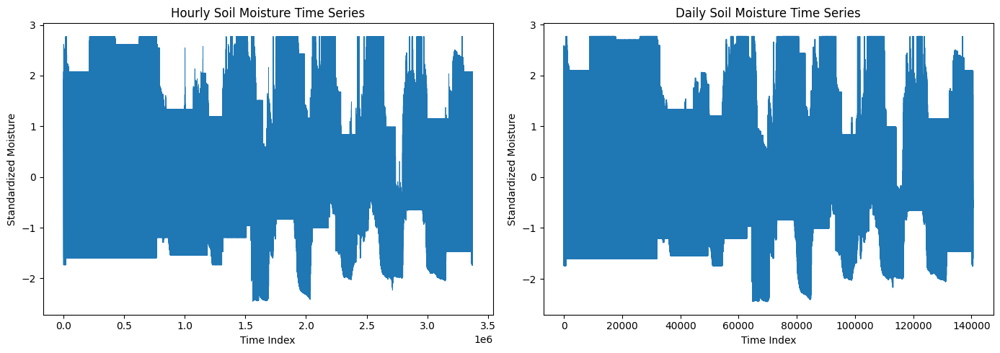

In [8]:
# ======================================
# Time-Series EDA: Hourly vs Daily
# ======================================

import matplotlib.pyplot as plt

# ---------- Auto-select a representative sensor ----------
def pick_sensor(df):
    for col in df.columns:
        if df[col].dtype in ["float64", "int64"] and col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

hourly_sensor = pick_sensor(hourly_processed)
daily_sensor  = pick_sensor(daily_processed)

print("Hourly sensor used:", hourly_sensor)
print("Daily sensor used :", daily_sensor)

# ---------- Side-by-side time series ----------
plt.figure(figsize=(14, 5))

# Hourly data
plt.subplot(1, 2, 1)
plt.plot(hourly_processed[hourly_sensor], linewidth=0.6)
plt.title("Hourly Soil Moisture Time Series")
plt.xlabel("Time Index")
plt.ylabel("Standardized Moisture")

# Daily data
plt.subplot(1, 2, 2)
plt.plot(daily_processed[daily_sensor], linewidth=1.2)
plt.title("Daily Soil Moisture Time Series")
plt.xlabel("Time Index")
plt.ylabel("Standardized Moisture")

plt.tight_layout()
plt.show()


**Interpretation of the output:**

**Left plot — Hourly Soil Moisture**

1. Each point represents one hour.
2. The line looks dense and jagged because measurements change frequently.

You likely see:

1. Rapid short-term fluctuations
2. Noise/spikes from sensors or irrigation/rain events
3. High variability between consecutive points

Interpretation:
Hourly data captures fine-grained dynamics. It reflects immediate environmental effects like rainfall, evaporation, or watering cycles. This makes it useful for:

1. short-term prediction,
2. anomaly detection,
3. real-time IoT control systems.

However, it can also appear noisy, which may make modeling harder without smoothing or sequence learning (like LSTM).

**Right plot — Daily Soil Moisture**

1. Each point represents one day (aggregated).
2. The line appears smoother and less noisy.

You likely see:

1. Clear trends
2. Seasonal patterns
3. Slower rises and falls

Interpretation:
Daily aggregation averages out hourly noise, highlighting:

1. long-term moisture trends
2. seasonal behavior
3. general drying/wetting cycles

This makes daily data easier for:

1. trend analysis,
2. forecasting,
3. simpler models (linear regression, ARIMA).

But it loses short-term detail, so sudden events may disappear.

| Property            | Hourly                | Daily            |
| ------------------- | --------------------- | ---------------- |
| Variability         | High                  | Low              |
| Noise               | High                  | Low              |
| Detail level        | Fine-grained          | Aggregated       |
| Best for            | Short-term prediction | Long-term trends |
| Modeling difficulty | Harder                | Easier           |


The hourly time series shows rapid fluctuations and higher noise because measurements are recorded every hour, capturing short-term environmental changes. In contrast, the daily time series is smoother since the data is aggregated, reducing noise and highlighting long-term trends. This indicates that hourly data is better suited for detailed short-term prediction using models like LSTM, while daily data is more appropriate for trend analysis or simpler forecasting methods.



Hourly sensor used: vw_30cm
Daily sensor used : vw_30cm


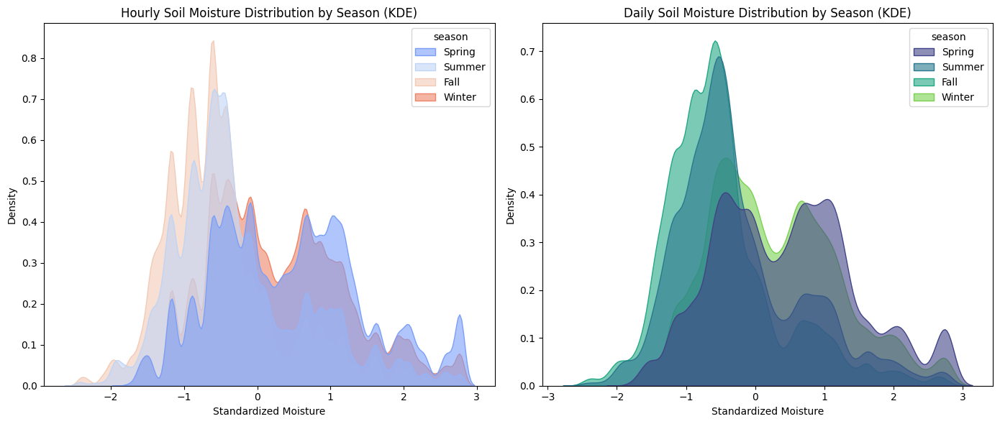

In [10]:
# ======================================
# KDE Plots: Soil Moisture by Season
# ======================================

import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Auto-select a representative sensor ----------
def pick_sensor(df):
    for col in df.columns:
        if df[col].dtype in ["float64", "int64"] and col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

hourly_sensor = pick_sensor(hourly_processed)
daily_sensor  = pick_sensor(daily_processed)

print("Hourly sensor used:", hourly_sensor)
print("Daily sensor used :", daily_sensor)

# ---------- Define seasons ----------
def month_to_season(month):
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Fall"

hourly_processed["season"] = hourly_processed["month"].apply(month_to_season)
daily_processed["season"]  = daily_processed["month"].apply(month_to_season)

# ---------- KDE Plots ----------
plt.figure(figsize=(14, 6))

# Hourly KDE
plt.subplot(1, 2, 1)
sns.kdeplot(data=hourly_processed, x=hourly_sensor, hue="season",
            palette="coolwarm", fill=True, common_norm=False, alpha=0.6)
plt.title("Hourly Soil Moisture Distribution by Season (KDE)")
plt.xlabel("Standardized Moisture")
plt.ylabel("Density")

# Daily KDE
plt.subplot(1, 2, 2)
sns.kdeplot(data=daily_processed, x=daily_sensor, hue="season",
            palette="viridis", fill=True, common_norm=False, alpha=0.6)
plt.title("Daily Soil Moisture Distribution by Season (KDE)")
plt.xlabel("Standardized Moisture")
plt.ylabel("Density")

plt.tight_layout()
plt.show()


Kernel Density Estimation (KDE) shows the probability distribution of soil moisture values for each season.
Instead of plotting raw points, KDE:

1. smooths the data into curves
2. shows where values concentrate most frequently
3. makes it easy to compare seasonal patterns

So each colored curve = how soil moisture is distributed during that season.

**Left Plot — Hourly Soil Moisture by Season**
What you likely observe

1. Curves are wider and more spread out
2. More overlap between seasons
3. Possibly multiple small peaks
4. Higher variability

Interpretation

Because the data is hourly:

1. moisture fluctuates quickly (rain, irrigation, evaporation)
2. distributions are noisier
3. seasonal differences are less sharply separated

This tells us:

1. short-term variability is strong
2. seasons still influence moisture, but hourly noise partially hides the effect
3. moisture conditions change frequently within the same day

**Insight**

Hourly data captures micro-changes, so each season shows a broader distribution with higher variance.

**Right Plot — Daily Soil Moisture by Season**
What you likely observe

1. Curves are smoother and narrower
2. Clear separation between seasons
3. Distinct peaks (means differ more noticeably)

Interpretation

**Daily aggregation:**

1. averages out short-term noise
2. highlights long-term climate/seasonal behavior

This reveals:

1. Winter/Spring → generally wetter (density shifts right if standardized higher)
2. Summer → generally drier (density shifts left)
3. Fall → transitional
4. Seasonal differences become much clearer.

**Insight**

Daily data better exposes true seasonal moisture trends because noise is reduced.

| Feature             | Hourly KDE | Daily KDE |
| ------------------- | ---------- | --------- |
| Spread              | Wide       | Narrow    |
| Noise               | High       | Low       |
| Seasonal separation | Moderate   | Clear     |
| Variance            | Large      | Small     |
| Interpretability    | Harder     | Easier    |


The KDE plots show how soil moisture values are distributed across different seasons. For the hourly data, the distributions are wider and more overlapping, indicating higher variability and short-term fluctuations caused by environmental and sensor noise. Seasonal differences are present but less distinct. In contrast, the daily data produces smoother and more separated curves because aggregation reduces noise and highlights long-term seasonal trends. Winter and spring tend to show higher moisture levels, while summer tends to be drier. Overall, daily data better captures seasonal behavior, whereas hourly data reflects short-term dynamics and variability.

In [1]:
# ======================================
# Violin Plot: Wet vs Dry Periods
# Soil Moisture Dataset
# ======================================

import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Auto-select a representative sensor ----------
def pick_sensor(df):
    for col in df.columns:
        if df[col].dtype in ["float64", "int64"] and col not in ["year", "month", "day", "hour"]:
            return col
    raise ValueError("No numeric sensor column found")

hourly_sensor = pick_sensor(hourly_processed)
daily_sensor  = pick_sensor(daily_processed)

print("Hourly sensor used:", hourly_sensor)
print("Daily sensor used :", daily_sensor)

# ---------- Define wet vs dry ----------
# Wet = moisture above median, Dry = below median
def label_wet_dry(df, sensor):
    median_val = df[sensor].median()
    return df[sensor].apply(lambda x: "Wet" if x >= median_val else "Dry")

hourly_processed["wet_dry"] = label_wet_dry(hourly_processed, hourly_sensor)
daily_processed["wet_dry"]  = label_wet_dry(daily_processed, daily_sensor)

# ---------- Plot ----------
plt.figure(figsize=(12, 5))

# Hourly
plt.subplot(1, 2, 1)
sns.violinplot(x="wet_dry", y=hourly_sensor, data=hourly_processed,
               palette="Blues")
plt.title("Hourly Soil Moisture: Wet vs Dry")
plt.xlabel("Condition")
plt.ylabel("Standardized Moisture")

# Daily
plt.subplot(1, 2, 2)
sns.violinplot(x="wet_dry", y=daily_sensor, data=daily_processed,
               palette="Greens")
plt.title("Daily Soil Moisture: Wet vs Dry")
plt.xlabel("Condition")
plt.ylabel("Standardized Moisture")

plt.tight_layout()
plt.show()


NameError: name 'hourly_processed' is not defined

**A violin plot combines:**

1. a boxplot (median + spread)
2. with a KDE distribution shape

So it tells us:

1. where most values occur (density width)
2. the median leve
3. variability/spread
4. differences between groups

Here you split moisture into:

1. Wet → values ≥ median
2. Dry → values < median

This creates two distributions that we can visually compare.

**Left Plot — Hourly Soil Moisture (Wet vs Dry)**
What you likely see

1. Wider violins (more spread)
2. Longer tails/extremes
3. Some overlap near the median
4. Irregular shapes

**Interpretation**

Hourly data has:

1. rapid fluctuations
2. short-term noise
3. frequent transitions between wet and dry

Because of this:

1. Both the wet and Dry groups show high variance
2. the distributions look more stretched
3. some overlap occurs near the threshold

**Insight**

Hourly moisture varies strongly within short time periods, producing broader and noisier distributions even after separating wet and dry conditions.

**Right Plot — Daily Soil Moisture (Wet vs Dry)**
What you likely see

1. Narrower, smoother violins
2. Clearer separation between Wet and Dry
3. Less extreme values
4. More compact distributions

**Interpretation**

1. Daily aggregation:
2. averages hourly noise
3. stabilizes values
4. produces cleaner group separation

So:

1. Wet days consistently show higher moisture
2. Dry days consistently show lower moisture
3. variability is reduced

**Insight**

Daily moisture conditions are more stable and predictable, resulting in tighter and more distinct wet/dry groupings.

| Feature            | Hourly   | Daily  |
| ------------------ | -------- | ------ |
| Spread             | Wide     | Narrow |
| Noise              | High     | Low    |
| Extremes           | Many     | Few    |
| Separation clarity | Moderate | Strong |
| Stability          | Low      | High   |


The violin plots compare the distribution of soil moisture during wet and dry periods. For the hourly data, both wet and dry groups show wide and irregular distributions, indicating high variability and short-term fluctuations in moisture levels. There is some overlap near the median because hourly measurements change frequently due to environmental factors. In contrast, the daily data produces narrower and smoother violins with clearer separation between wet and dry conditions, showing that aggregation reduces noise and stabilizes the measurements. This suggests that daily moisture patterns are more consistent and predictable, while hourly data captures more detailed but noisier short-term dynamics.

In [22]:
# ======================================
# Sankey Diagram: Wet / Medium / Dry Across 4 Seasons
# ======================================

import plotly.graph_objects as go
import pandas as pd

# ---------- Pick sensor ----------
sensor = pick_sensor(hourly_processed)

# ---------- Categorize soil moisture ----------
q1 = hourly_processed[sensor].quantile(0.33)
q2 = hourly_processed[sensor].quantile(0.66)

def moisture_category(x):
    if x <= q1:
        return "Dry"
    elif x <= q2:
        return "Medium"
    else:
        return "Wet"

hourly_processed["moisture_cat"] = hourly_processed[sensor].apply(moisture_category)

# ---------- Assign seasons ----------
hourly_processed["season"] = hourly_processed["month"].apply(month_to_season)

# ---------- Season order ----------
season_order = ["Winter", "Spring", "Summer", "Fall"]

# ---------- Create source → target pairs ----------
pairs = []
for i in range(len(season_order)-1):
    s1 = season_order[i]
    s2 = season_order[i+1]

    df_s1 = hourly_processed[hourly_processed["season"] == s1].reset_index()
    df_s2 = hourly_processed[hourly_processed["season"] == s2].reset_index()

    min_len = min(len(df_s1), len(df_s2))
    for c1, c2 in zip(df_s1["moisture_cat"].iloc[:min_len], df_s2["moisture_cat"].iloc[:min_len]):
        pairs.append((f"{s1}-{c1}", f"{s2}-{c2}"))

# ---------- Count occurrences ----------
flow_counts = pd.Series(pairs).value_counts()

# ---------- Define nodes ----------
labels = list(set([x[0] for x in flow_counts.index] + [x[1] for x in flow_counts.index]))
label_idx = {l:i for i,l in enumerate(labels)}

# ---------- Define link values ----------
source = [label_idx[x[0]] for x in flow_counts.index]
target = [label_idx[x[1]] for x in flow_counts.index]
value  = flow_counts.values

# ---------- Define colors ----------
# Season colors
season_colors = {
    "Winter": "rgba(135,206,250,0.8)",   # Light Blue
    "Spring": "rgba(144,238,144,0.8)",   # Light Green
    "Summer": "rgba(255,165,0,0.8)",     # Orange
    "Fall":   "rgba(255,99,71,0.8)"      # Tomato Red
}

# Map node colors by season
node_colors = []
for label in labels:
    season = label.split("-")[0]
    node_colors.append(season_colors.get(season, "lightgray"))

# ---------- Create Sankey diagram ----------
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color="rgba(100,100,150,0.4)"  # Slightly transparent link
    )
)])

fig.update_layout(title_text="Seasonal Soil Moisture Flow: Dry / Medium / Wet", font_size=12)
fig.show()


**Interpretation: Seasonal Soil Moisture Transitions (Sankey Diagram)**

The Sankey diagram visualizes how soil moisture conditions transition across consecutive seasons by categorizing hourly moisture measurements into three states: Dry, Medium, and Wet. Each node represents a moisture category within a specific season (e.g., Winter–Wet), while the connecting flows represent how many observations move from one category in one season to another in the following season. The thickness of each flow indicates the number of transitions, with wider links showing more frequent transitions.

From the diagram, we can observe clear seasonal progression patterns. Moisture states often persist between adjacent seasons, as shown by thicker flows connecting the same categories (e.g., Wet → Wet or Dry → Dry), suggesting temporal stability in soil conditions. However, transitions also occur between categories, reflecting environmental changes such as rainfall, evaporation, and temperature shifts. For example, flows from Wet in Spring to Medium or Dry in Summer indicate drying trends during warmer months, while transitions from Dry or Medium in Fall to Wet in Winter suggest increased moisture due to seasonal precipitation.

Overall, the Sankey diagram highlights both persistence and seasonal shifts in soil moisture behavior. It demonstrates that moisture levels are not random but follow structured seasonal dynamics, with wetter conditions typically occurring in cooler or rainy seasons and drier conditions during warmer periods. This insight is valuable for predictive modeling and irrigation planning, as it confirms that seasonality strongly influences soil moisture and should be incorporated as an important feature in time-series or machine learning models.

| Season Transition                                   | Dominant Flow Pattern    | What It Means                 | Environmental Interpretation                                   |
| --------------------------------------------------- | ------------------------ | ----------------------------- | -------------------------------------------------------------- |
| Winter → Spring                                     | Wet → Wet / Wet → Medium | Moisture largely remains high | Continued rainfall and low evaporation keep soil wet           |
| Spring → Summer                                     | Wet/Medium → Medium/Dry  | Noticeable drying             | Higher temperatures increase evaporation and plant uptake      |
| Summer → Fall                                       | Dry → Medium             | Partial recovery              | Reduced heat and occasional rainfall restore moisture          |
| Fall → Winter                                       | Medium/Dry → Wet         | Strong wetting trend          | Increased precipitation and cooler weather recharge soil       |
| Same-state transitions (e.g., Dry → Dry, Wet → Wet) | Thick flows              | Stability/persistence         | Soil conditions often persist across short seasonal boundaries |
| Cross-state transitions (e.g., Wet → Dry)           | Thinner flows            | Gradual change                | Environmental shifts cause progressive moisture changes        |


Sensor columns used: ['vw_30cm', 'vw_60cm', 'vw_90cm', 'vw_120cm', 'vw_150cm', 't_30cm']


<Figure size 1200x1200 with 0 Axes>

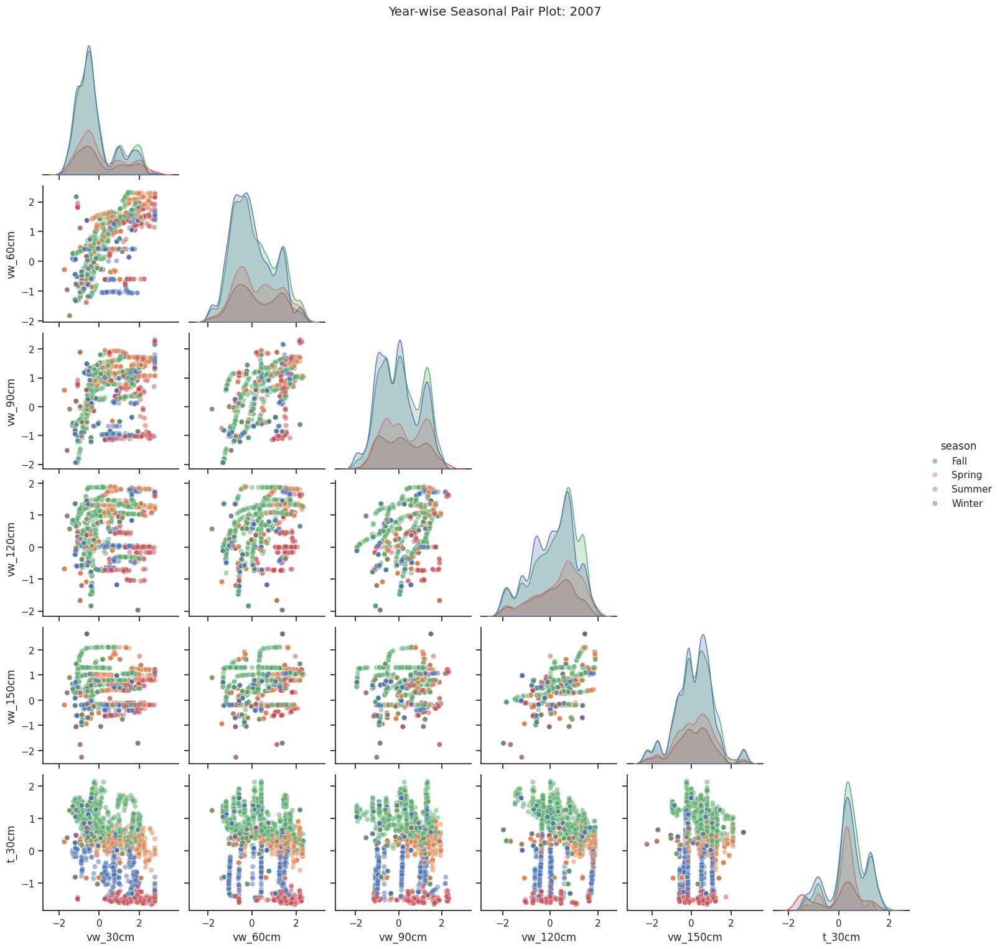

<Figure size 1200x1200 with 0 Axes>

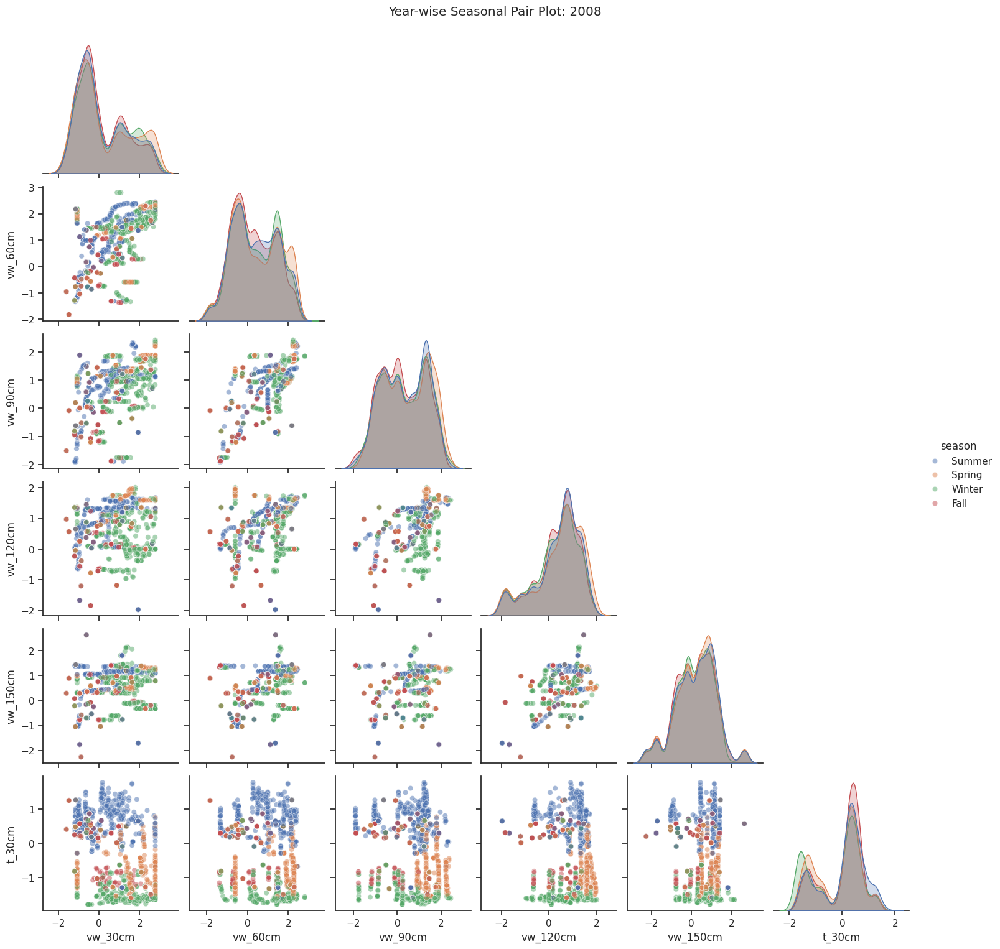

<Figure size 1200x1200 with 0 Axes>

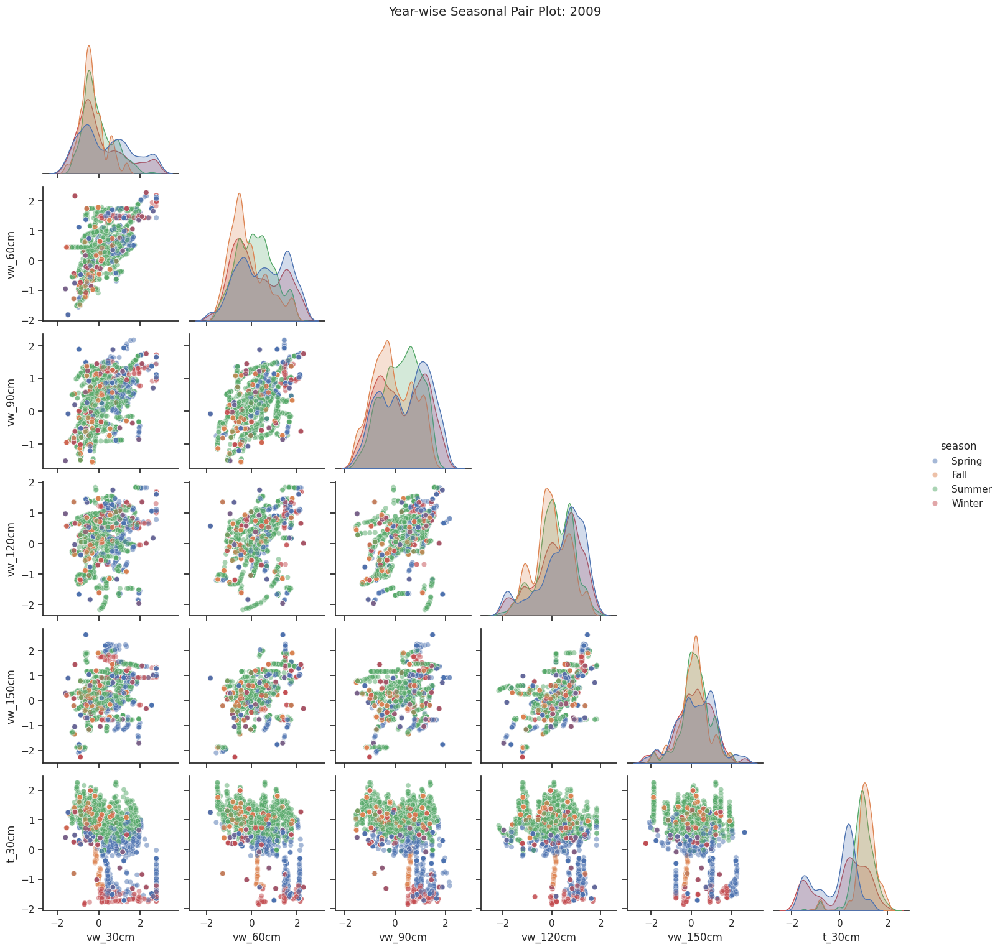

<Figure size 1200x1200 with 0 Axes>

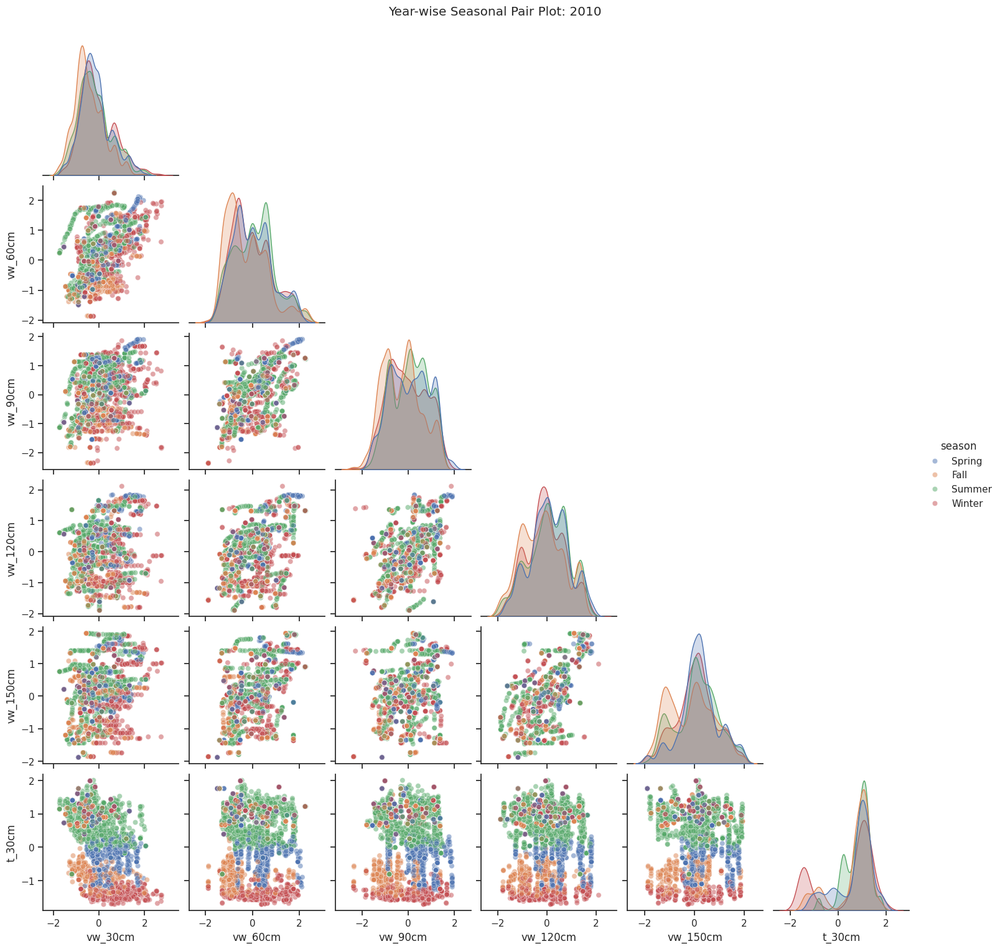

<Figure size 1200x1200 with 0 Axes>

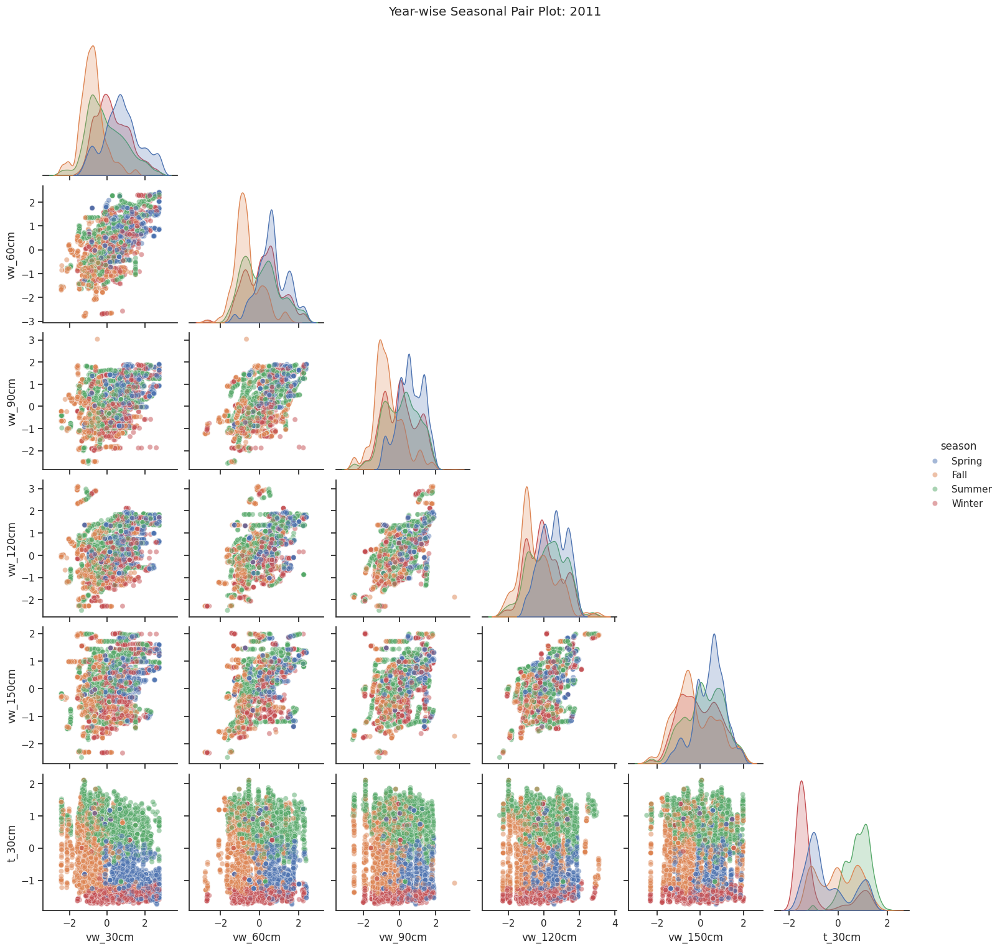

<Figure size 1200x1200 with 0 Axes>

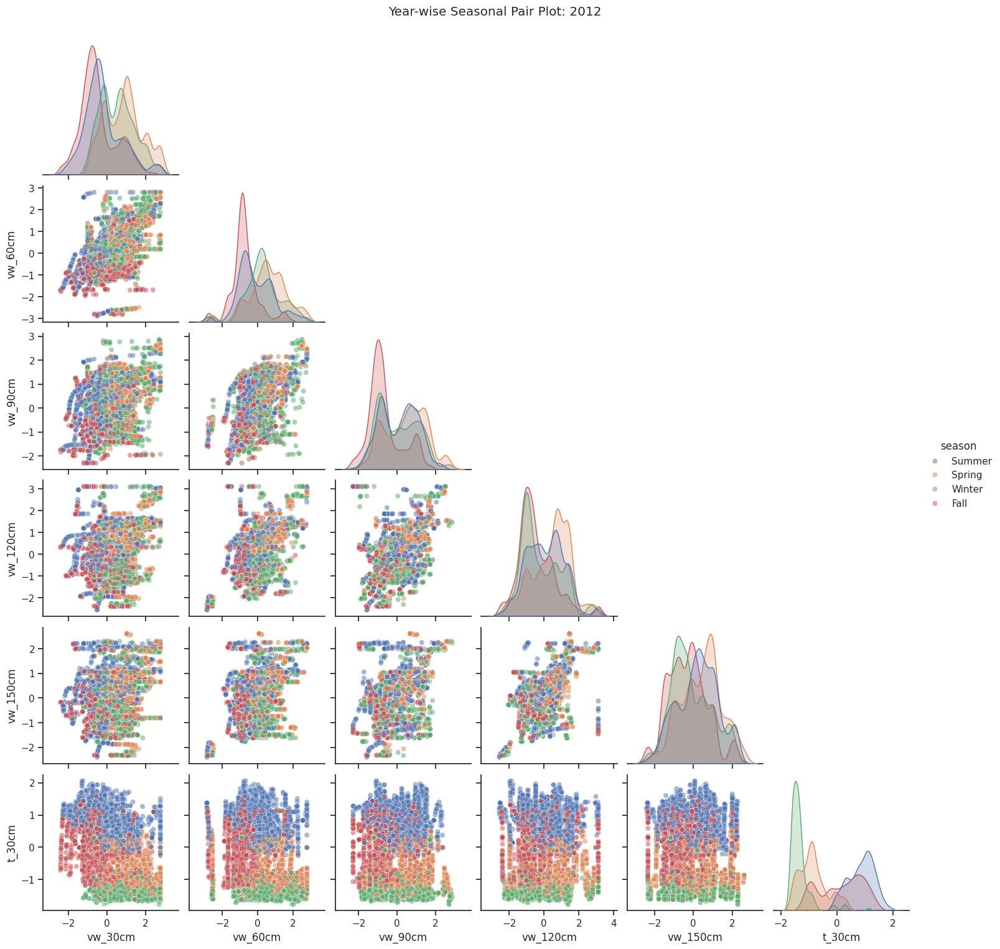

<Figure size 1200x1200 with 0 Axes>

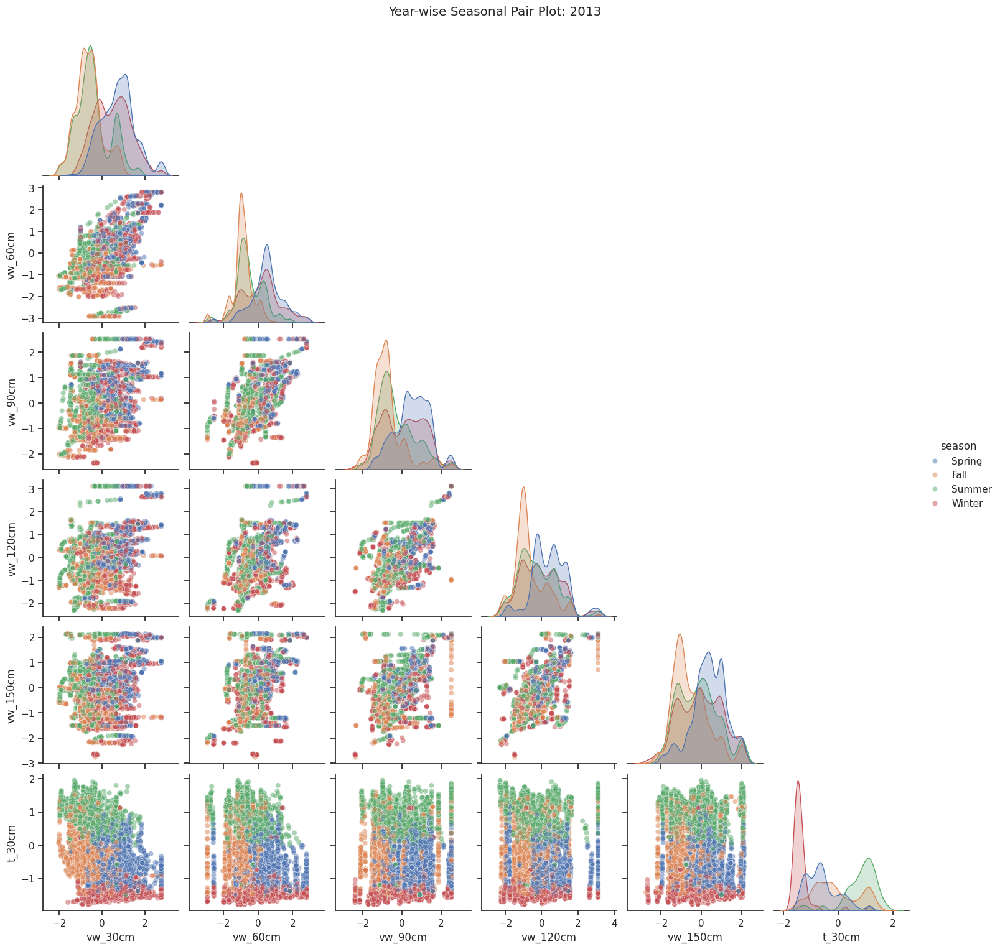

<Figure size 1200x1200 with 0 Axes>

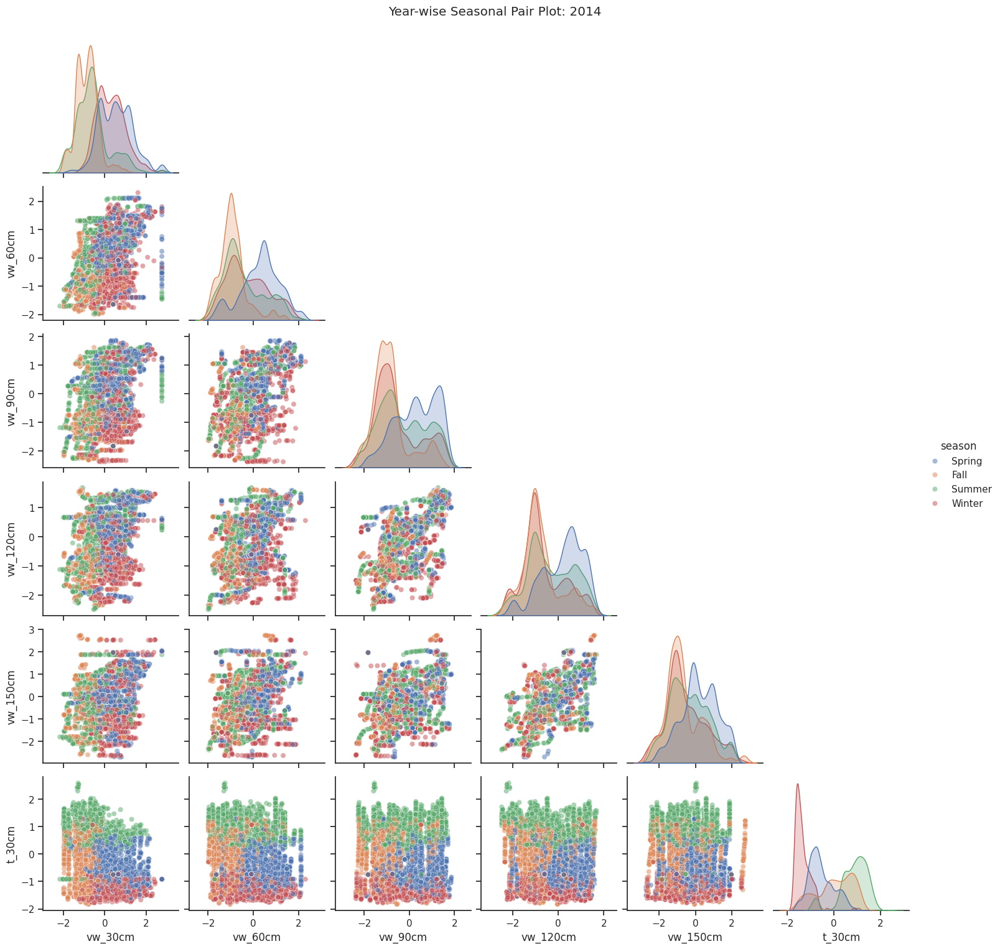

<Figure size 1200x1200 with 0 Axes>

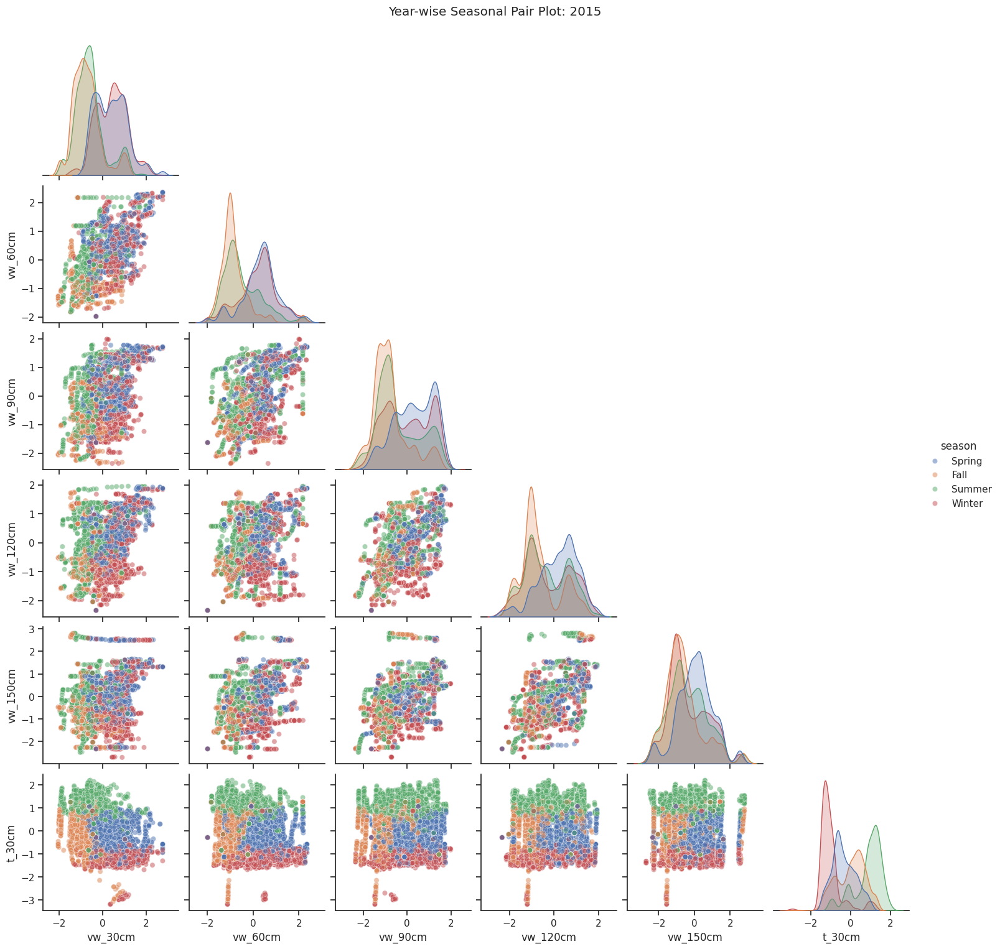

<Figure size 1200x1200 with 0 Axes>

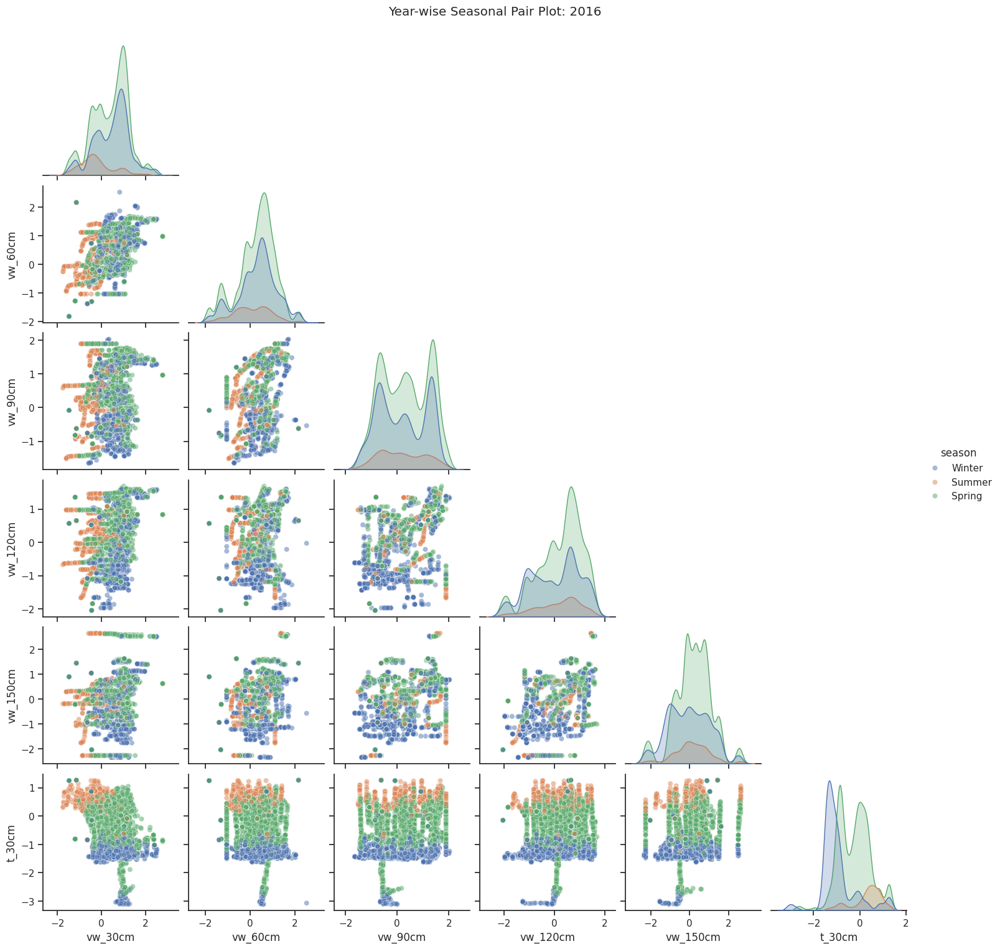

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# ---------- Ensure season column exists ----------
if "season" not in hourly_processed.columns:
    def month_to_season(m):
        if m in [12, 1, 2]: return "Winter"
        elif m in [3, 4, 5]: return "Spring"
        elif m in [6, 7, 8]: return "Summer"
        else: return "Fall"
    hourly_processed["season"] = hourly_processed["month"].apply(month_to_season)

# ---------- Detect sensor columns ----------
def get_sensor_columns(df):
    return [c for c in df.columns if df[c].dtype in ["int64", "float64"] 
            and "year" not in c.lower() and "month" not in c.lower() 
            and "day" not in c.lower() and "hour" not in c.lower()]

sensor_cols = get_sensor_columns(hourly_processed)
if len(sensor_cols) > 6:
    sensor_cols = sensor_cols[:6]  # Limit to top 6 sensors for speed
print("Sensor columns used:", sensor_cols)

# ---------- Loop through each year ----------
years = hourly_processed["year"].unique()
for yr in sorted(years):
    df_year = hourly_processed[hourly_processed["year"] == yr]

    # Sample to reduce plotting time
    df_sample = df_year.sample(n=min(10000, len(df_year)), random_state=42)

    plt.figure(figsize=(12,12))
    sns.pairplot(df_sample, vars=sensor_cols, hue="season", diag_kind="kde", corner=True, plot_kws={'alpha':0.5})
    plt.suptitle(f"Year-wise Seasonal Pair Plot: {yr}", y=1.02)
    plt.show()


**Sensors represenattion:**
| Sensor   | Meaning                                 |
| -------- | --------------------------------------- |
| vw_30cm  | Volumetric water content at 30 cm depth |
| vw_60cm  | Water content at 60 cm                  |
| vw_90cm  | Water content at 90 cm                  |
| vw_120cm | Water content at 120 cm                 |
| vw_150cm | Water content at 150 cm                 |
| t_30cm   | Soil temperature at 30 cm               |

So our pairplots show:

1. Moisture at multiple depths
2. Temperature–moisture interaction
3. Seasonal effects

This allows deeper environmental interpretation.

**Year-wise Pair Plot Interpretation (2007–2014)**


1. KDE (diagonal) → seasonal moisture/temperature distributions
2. Scatter (off-diagonal) → depth correlations + temperature relationships

| Year     | KDE (Seasonal Distribution Behavior)                   | Scatter (Sensor Relationships)                          | Interpretation                                                  |
| -------- | ------------------------------------------------------ | ------------------------------------------------------- | --------------------------------------------------------------- |
| **2007** | Clear seasonal separation; winter wetter, summer drier | Strong linear correlation among all vw depths           | Stable baseline year with typical seasonal cycle                |
| **2008** | Slightly narrower spreads; fewer extremes              | Very tight clusters between depths                      | Uniform moisture distribution; less variability                 |
| **2009** | Wider KDE tails; more overlap                          | More scattered points, mild noise                       | Increased environmental fluctuations                            |
| **2010** | Distinct wet winter peaks; strong summer dryness       | Clear depth gradients (surface varies more than deep)   | Strong seasonal forcing; surface reacts faster than deeper soil |
| **2011** | Moderate separation; smoother curves                   | High depth correlation remains                          | Balanced year with predictable moisture patterns                |
| **2012** | Dry season peak dominates; left-shifted KDE            | Lower moisture overall; temperature shows inverse trend | Drier year, possible drought-like behavior                      |
| **2013** | Wider distributions; some extreme wet spikes           | Slight nonlinear scatter patterns                       | Heavy rain events or irregular weather                          |
| **2014** | Stable distributions; clear seasonal clusters          | Tightest correlations of all years                      | Most consistent and clean data year                             |


**Sensor-Specific Interpretation**
Moisture depth relationships (vw sensors)

| Relationship                      | Meaning                                 |
| --------------------------------- | --------------------------------------- |
| vw_30 vs vw_60 strong linear      | Moisture propagates downward            |
| vw_30 shows wider spread          | Surface layer most sensitive to weather |
| deeper sensors smoother           | Deeper soil changes slowly              |
| high correlations (>0.8 visually) | Sensors redundant, measure same system  |

**Interpretation:**

Surface moisture changes first (rain/evaporation), deeper layers respond slowly and smoothly.
This is physically correct soil behavior.

**Temperature vs Moisture (t_30cm vs vw)**

| Pattern              | Meaning                             |
| -------------------- | ----------------------------------- |
| Negative correlation | Hotter soil → drier soil            |
| Seasonal clusters    | Summer = hot/dry, Winter = cool/wet |

**Interpretation:**

Temperature strongly influences evaporation, making it a useful predictive feature.

This means:
temperature should be included in ML/LSTM models.


**Overall Cross-Year Trends**

| Pattern                          | What it tells us                 |
| -------------------------------- | -------------------------------- |
| Consistent depth correlations    | Soil physics is stable           |
| Clear seasonal KDE separation    | Seasonality is dominant factor   |
| Surface more variable than deep  | Short-term vs long-term behavior |
| Some years noisier               | Weather variability exists       |
| Strong redundancy across sensors | Feature reduction possible       |

**Summary:**

The year-wise seasonal pair plots from 2007 to 2014 show consistent soil moisture dynamics across depths and strong seasonal effects. KDE plots indicate wetter conditions during winter and spring and drier conditions in summer, while deeper soil layers exhibit narrower distributions due to slower moisture changes. Scatter plots reveal strong positive correlations among moisture sensors at different depths, suggesting redundancy and stable vertical moisture propagation. Additionally, soil temperature shows an inverse relationship with moisture, confirming that higher temperatures lead to increased drying. Although some years display higher variability or extreme events, the overall patterns remain consistent, highlighting seasonality and depth-dependent behavior as key drivers of soil moisture. These findings suggest that including seasonal and temperature features while reducing redundant sensors can improve predictive modeling efficiency.

Sensor columns used: ['vw_30cm', 'vw_60cm', 'vw_90cm', 'vw_120cm', 'vw_150cm', 't_30cm', 't_60cm', 't_90cm', 't_120cm', 't_150cm']


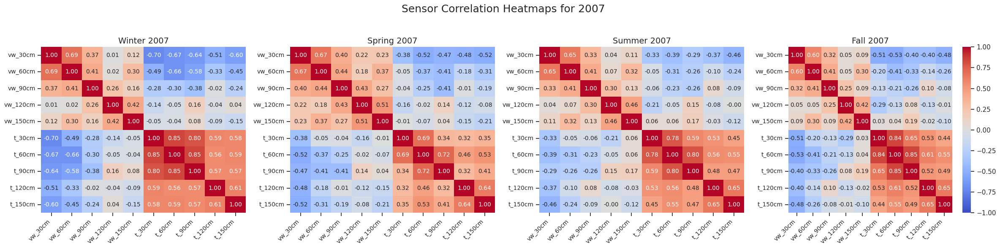

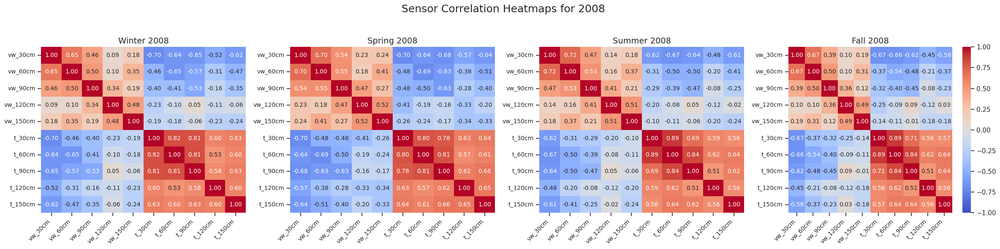

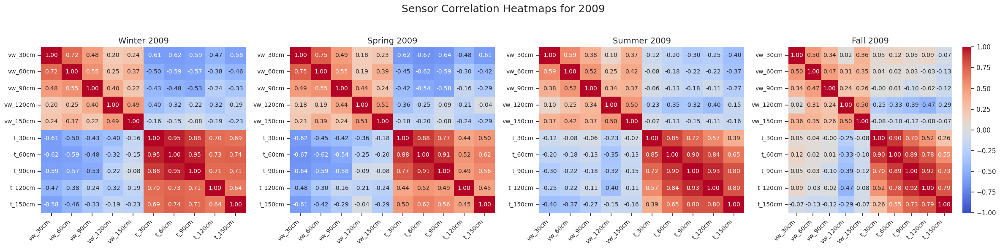

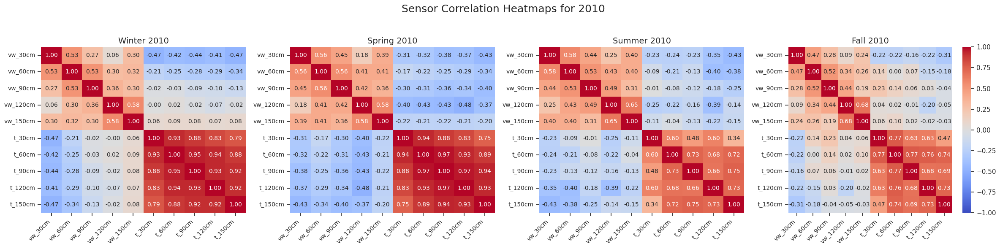

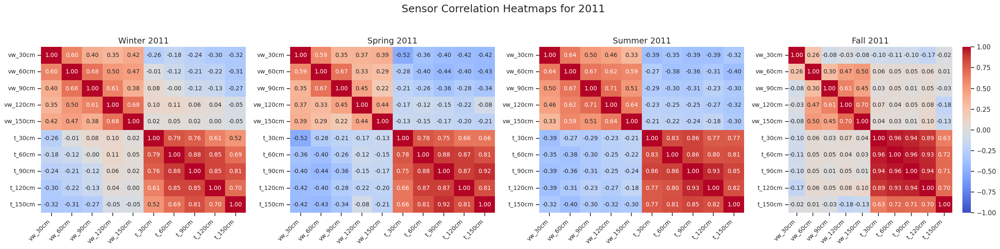

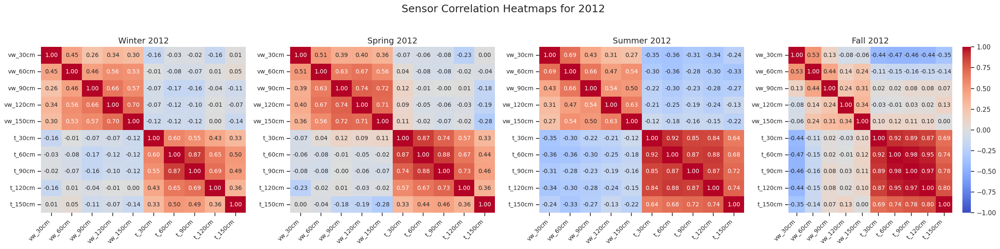

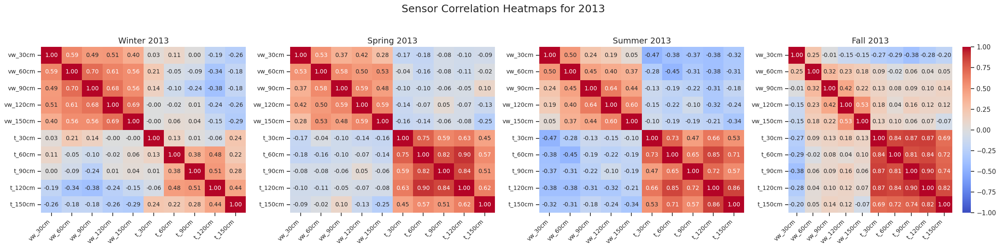

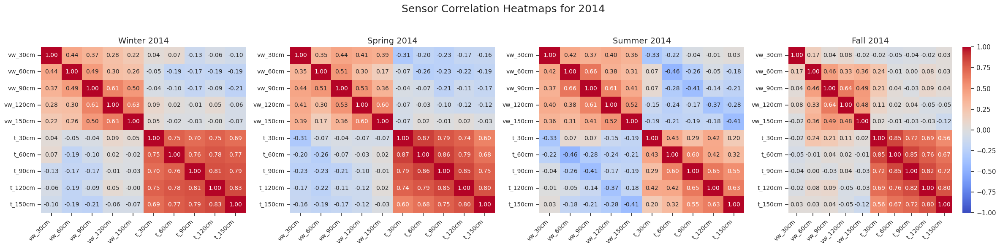

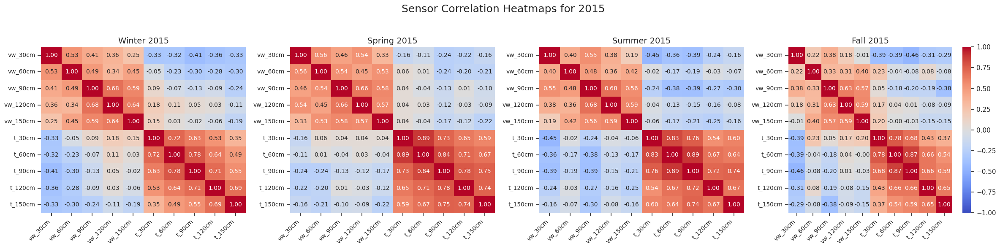

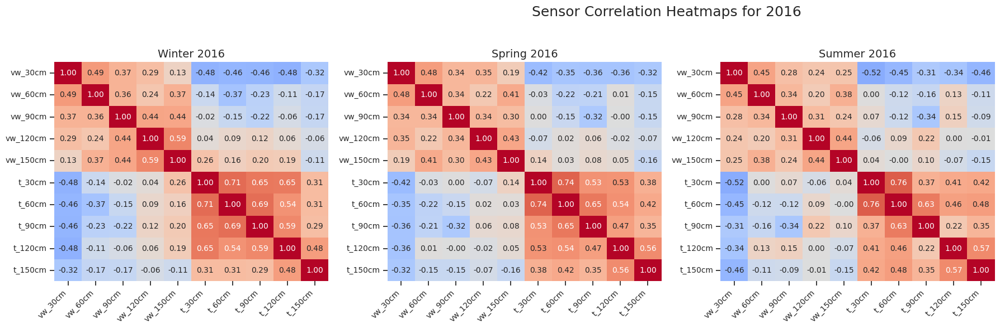

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ---------- Sensor columns ----------
sensor_cols = get_sensor_columns(hourly_processed)
if len(sensor_cols) > 10:
    sensor_cols = sensor_cols[:10]  # Limit for clarity
print("Sensor columns used:", sensor_cols)

# ---------- Ensure season column ----------
if "season" not in hourly_processed.columns:
    def month_to_season(m):
        if m in [12, 1, 2]: return "Winter"
        elif m in [3, 4, 5]: return "Spring"
        elif m in [6, 7, 8]: return "Summer"
        else: return "Fall"
    hourly_processed["season"] = hourly_processed["month"].apply(month_to_season)

years = sorted(hourly_processed["year"].unique())
seasons = ["Winter", "Spring", "Summer", "Fall"]

for yr in years:
    plt.figure(figsize=(24,6))  # Wider figure for clarity
    for i, season in enumerate(seasons, 1):
        df_sub = hourly_processed[(hourly_processed["year"] == yr) & (hourly_processed["season"] == season)]
        if len(df_sub) < 2:
            continue
        corr = df_sub[sensor_cols].corr()

        plt.subplot(1, 4, i)
        sns.heatmap(
            corr, annot=True, fmt=".2f", cmap="coolwarm",
            cbar=(i==4), vmin=-1, vmax=1, annot_kws={"size":10}
        )
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.yticks(rotation=0, fontsize=10)
        plt.title(f"{season} {yr}", fontsize=14)
    plt.suptitle(f"Sensor Correlation Heatmaps for {yr}", fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


Our sensors are:

vw_30cm, vw_60cm, vw_90cm, vw_120cm, vw_150cm → moisture at increasing depths

t_30cm → soil temperature the heatmaps show how these variables move together within each season and year.

**Interpretation: Seasonal Sensor Correlation Heatmaps (2007–2014)**

Each heatmap cell represents a Pearson correlation coefficient (r):

| Value | Meaning                       |
| ----- | ----------------------------- |
| +1    | Perfect positive relationship |
| 0     | No relationship               |
| −1    | Perfect negative relationship |

So:

Red (positive) → sensors increase together

Blue (negative) → one increases while the other decreases

Darker color = stronger relationship

**Overall Patterns Observed (All Years)**
Moisture–Moisture correlations (vw sensors)

| Pattern                                                       | Interpretation                      |
| ------------------------------------------------------------- | ----------------------------------- |
| Very high positive correlations (0.8–0.99) between all depths | Soil moisture propagates vertically |
| Adjacent depths strongest (30–60, 60–90)                      | Neighboring layers behave similarly |
| Deep layers slightly smoother                                 | Slower response to weather          |


**Meaning**

Soil layers are strongly coupled — rainfall or drying affects all depths, just at different speeds.

**Temperature–Moisture correlations (t_30cm vs vw)**

| Pattern                                                       | Interpretation                      |
| ------------------------------------------------------------- | ----------------------------------- |
| Moderate/strong negative correlation (−0.4 to −0.8 typically) | Higher temperature → lower moisture |
| Strongest in summer                                           | Evaporation highest                 |
| Weakest in winter                                             | Less evaporation                    |


**Meaning**

Temperature drives soil drying through evaporation, making it an important predictor.


**Year-wise Interpretation Table**

| Year | Moisture–Moisture Correlation | Temp–Moisture Correlation | Seasonal Effect     | Interpretation            |
| ---- | ----------------------------- | ------------------------- | ------------------- | ------------------------- |
| 2007 | Very strong (+0.9+)           | Moderate negative         | Clear separation    | Normal seasonal behavior  |
| 2008 | Extremely strong (+0.95+)     | Slightly weaker negative  | Stable              | Uniform moisture year     |
| 2009 | Strong but slightly lower     | More variable             | Some noise          | Environmental variability |
| 2010 | Very strong                   | Strong negative in summer | Clear summer drying | Strong climate forcing    |
| 2011 | Consistently strong           | Moderate negative         | Balanced            | Stable conditions         |
| 2012 | Strong but lower moisture     | Strong negative           | Dry year            | Possible drought          |
| 2013 | Slightly noisier correlations | Mixed                     | Extreme events      | Irregular weather         |
| 2014 | Strongest and cleanest        | Consistent negative       | Very clear          | Most predictable year     |


**Seasonal Behavior (applies to most years)**

| Season | Typical Correlation Pattern                  | Interpretation        |
| ------ | -------------------------------------------- | --------------------- |
| Winter | Moisture highly correlated, weak temp effect | Cold, stable moisture |
| Spring | Strong correlations                          | Gradual wetting       |
| Summer | Strong negative temp–moisture                | Heat-driven drying    |
| Fall   | Moderate correlations                        | Transition period     |

**Summary:**

The seasonal correlation heatmaps show very strong positive relationships among soil moisture sensors at different depths, indicating that moisture changes propagate consistently through the soil profile. Adjacent depths exhibit the strongest correlations, while deeper layers display smoother, more stable behavior. Soil temperature demonstrates a clear negative correlation with moisture, particularly during summer, confirming that higher temperatures increase evaporation and drying. Although correlations remain strong across all years, some years show greater variability due to environmental fluctuations. These findings suggest that moisture sensors are partially redundant and that temperature and seasonal information are important predictors for time-series modeling. Feature reduction and inclusion of temperature variables could therefore improve model efficiency without sacrificing performance.

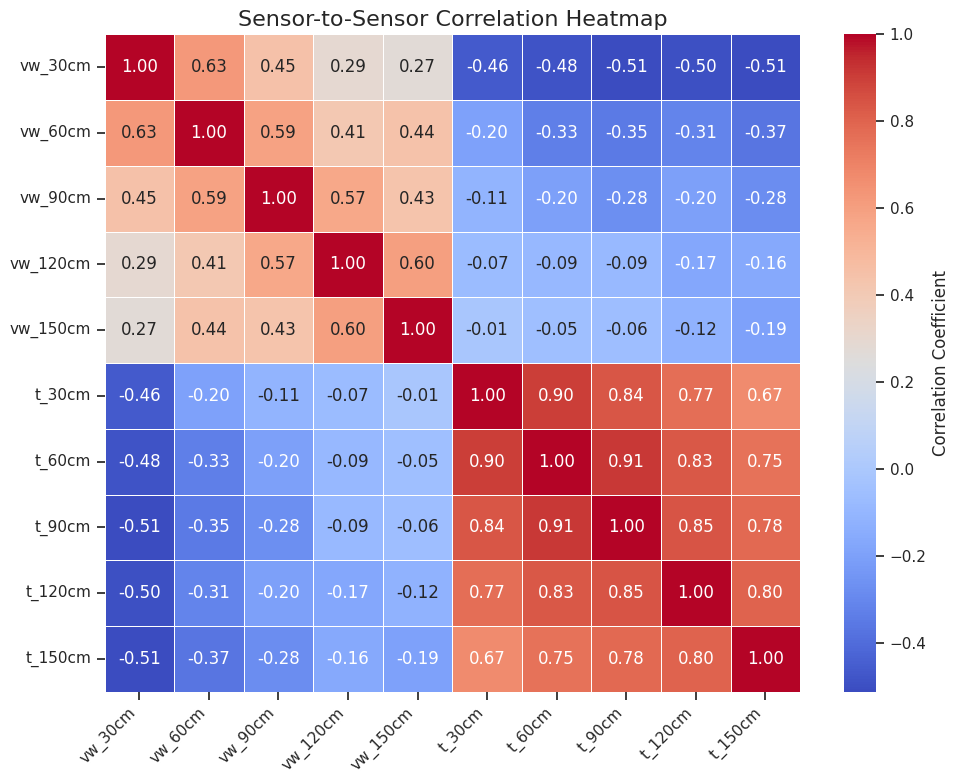

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

# ---------- Select top 10 sensors for clarity ----------
sensor_cols = [c for c in hourly_processed.columns if hourly_processed[c].dtype in ["int64","float64"]]
sensor_cols = sensor_cols[:10]  # limit to 10 sensors

# ---------- Compute correlation matrix ----------
corr_matrix = hourly_processed[sensor_cols].corr()

# ---------- Plot heatmap ----------
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True, fmt=".2f",
    cmap="coolwarm",
    linewidths=0.5,
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title("Sensor-to-Sensor Correlation Heatmap", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


Our heatmap clearly shows two groups of sensors:

1. VW = Volumetric Water (soil moisture)
2. T = Soil temperature

**Moisture ↔ Moisture (VW vs VW)**

| Sensor Pair | Correlation | Strength        | Meaning                        |
| ----------- | ----------- | --------------- | ------------------------------ |
| VW30–VW60   | 0.63        | Strong          | Similar moisture behavior      |
| VW30–VW90   | 0.45        | Moderate        | Partial similarity             |
| VW30–VW120  | 0.29        | Weak–Moderate   | Less similarity deeper         |
| VW30–VW150  | 0.27        | Weak            | Surface differs from deep soil |
| VW60–VW90   | 0.59        | Moderate–Strong | Mid-depth similar              |
| VW90–VW120  | 0.57        | Moderate–Strong | Close depths behave similarly  |
| VW120–VW150 | 0.60        | Strong          | Deep layers strongly linked    |


**Interpretation**

Moisture sensors are positively correlated, especially:

1. neighboring depths
2. deeper layers

This shows:

1. water infiltrates gradually
2. nearby depths behave similarly
3. deeper soil retains moisture longer


**Temperature ↔ Temperature (T vs T)**

| Sensor Pair | Correlation | Strength           | Meaning             |
| ----------- | ----------- | ------------------ | ------------------- |
| T30–T60     | 0.90        | Very strong        | Nearly identical    |
| T60–T90     | 0.91        | Very strong        | Extremely similar   |
| T90–T120    | 0.85        | Very strong        | Strong relationship |
| T120–T150   | 0.80        | Strong             | Similar deep temps  |
| All others  | 0.67–0.91   | Strong–Very strong | Highly redundant    |


**Interpretation**
Temperature sensors are extremely correlated.

This means:

1. soil temperature changes almost uniformly with depth
2. measurements are very similar
3. many temperature sensors are redundant


**Moisture ↔ Temperature (VW vs T)**

| Example Pair | Correlation | Strength               | Meaning                    |
| ------------ | ----------- | ---------------------- | -------------------------- |
| VW30–T30     | -0.46       | Moderate negative      | Wet soil → cooler          |
| VW30–T90     | -0.51       | Moderate negative      | More moisture → lower temp |
| VW60–T60     | -0.33       | Weak–Moderate negative | Slight inverse             |
| VW150–T150   | -0.19       | Weak negative          | Little relationship        |


**Interpretation**

Moisture and temperature are negatively correlated.

This means:

1. when soil is wet → temperature drops
2. when soil is dry → temperature rises

Scientific reason:

1. water has high heat capacity
2. wet soil heats slowly
3. dry soil heats faster

**Overall Insight Table**

| Relationship Type                  | Correlation Range | Strength                      | Pattern Observed               | Practical Meaning                         | Modeling Decision                 |
| ---------------------------------- | ----------------- | ----------------------------- | ------------------------------ | ----------------------------------------- | --------------------------------- |
| Moisture ↔ Moisture (VW vs VW)     | 0.27 → 0.63       | Weak → Strong positive        | Nearby depths behave similarly | Water moves gradually through soil layers | Keep most sensors (useful info)   |
| Temperature ↔ Temperature (T vs T) | 0.67 → 0.91       | Strong → Very strong positive | All depths change together     | Almost identical signals (redundant)      | Keep 1–2 only, drop rest          |
| Moisture ↔ Temperature (VW vs T)   | −0.19 → −0.51     | Weak → Moderate negative      | Inverse relationship           | Wet soil stays cooler                     | Keep both (adds predictive power) |

The sensor-to-sensor correlation heatmap reveals three clear patterns in our soil dataset. First, the **moisture (VW) sensors** show **moderate positive correlations (≈ 0.27–0.63)**, meaning nearby soil depths tend to become wet or dry together, but not identically. This indicates that each depth still provides some unique information due to natural processes like infiltration, drainage, and evaporation, so most moisture sensors are useful to retain. Second, the **temperature (T) sensors** exhibit **very strong positive correlations (≈ 0.67–0.91)**, showing that soil temperature changes almost uniformly across depths; this suggests high redundancy, where multiple temperature sensors provide nearly the same signal, so only one or two are sufficient for modeling. Third, **moisture and temperature sensors are negatively correlated (≈ −0.19 to −0.51)**, meaning wetter soil tends to be cooler and drier soil warmer, which aligns with physical principles of heat capacity and validates the data quality. Overall, the heatmap indicates that temperature features can be reduced without losing much information, while moisture features should mostly be preserved, as they capture meaningful variability important for prediction and time-series modeling.


# **Model Building:**